In [1]:
import cv2
import pandas as pd
import os
import csv
import random

In [2]:
import os
main_path = "C:/Users/hosei/Documents/torch-data/UCF-101/"
counter = 0

In [3]:
def FrameCapture(path , save_path , SARcount):
    vidObj = cv2.VideoCapture(path)
    count = 0
    success = 1
    while success:
        success, image = vidObj.read()
        pth = save_path + str(SARcount)+"frame%d.jpg" % count
        if count % 15 == 0:
            cv2.imwrite(pth, image)
        count += 1

In [2]:
for filename in os.listdir(main_path):
    f = os.path.join(main_path, filename)
    for index , video in enumerate(os.listdir(f)):
        try:    
            if video != "Frames":
                vid_path = os.path.join(f, video)
                save_path = f + "/Frames/"
                print(save_path)
                print(vid_path)
                FrameCapture(vid_path , save_path=save_path , SARcount=counter)
                counter += 1
        except:
            AttributeError

C:/Users/hosei/Documents/torch-data/UCF-101/ApplyEyeMakeup/Frames/
C:/Users/hosei/Documents/torch-data/UCF-101/ApplyEyeMakeup\v_ApplyEyeMakeup_g01_c01.avi
C:/Users/hosei/Documents/torch-data/UCF-101/ApplyEyeMakeup/Frames/
C:/Users/hosei/Documents/torch-data/UCF-101/ApplyEyeMakeup\v_ApplyEyeMakeup_g01_c02.avi
C:/Users/hosei/Documents/torch-data/UCF-101/ApplyEyeMakeup/Frames/
C:/Users/hosei/Documents/torch-data/UCF-101/ApplyEyeMakeup\v_ApplyEyeMakeup_g01_c03.avi
C:/Users/hosei/Documents/torch-data/UCF-101/ApplyEyeMakeup/Frames/
C:/Users/hosei/Documents/torch-data/UCF-101/ApplyEyeMakeup\v_ApplyEyeMakeup_g01_c04.avi
C:/Users/hosei/Documents/torch-data/UCF-101/ApplyEyeMakeup/Frames/
C:/Users/hosei/Documents/torch-data/UCF-101/ApplyEyeMakeup\v_ApplyEyeMakeup_g01_c05.avi
C:/Users/hosei/Documents/torch-data/UCF-101/ApplyEyeMakeup/Frames/
C:/Users/hosei/Documents/torch-data/UCF-101/ApplyEyeMakeup\v_ApplyEyeMakeup_g01_c06.avi
C:/Users/hosei/Documents/torch-data/UCF-101/ApplyEyeMakeup/Frames/
C:/

In [6]:
index_list = []
filename_list = []
meta = "C:/Users/hosei/Documents/torch-data/UCF-101/meta.csv"

for index , filename in enumerate(os.listdir(main_path)):
    index_list.append(index)
    filename_list.append(filename)
# f = os.path.join(main_path, filename)
# f = f + "/Frames/"
# print(f)
# for index , video in enumerate(os.listdir(f)):
#     video

meta_list = zip(index_list , filename_list)

with open(meta , 'w' , newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    table = ["classID" , "class_name"]
    csvwriter.writerow(table)
    csvwriter.writerows(meta_list)

In [9]:
class_id = []
img_path = []
for index , foldername in enumerate(os.listdir(main_path+"/Data")):
    for inner_index , filename in enumerate(os.listdir(main_path+"/Data/"+foldername+"/Frames/")):
        class_id.append(foldername)
        img_path.append(filename)

In [12]:
for i in range(len(class_id)):
    print(f'class id = {class_id[i]} , file_name = {img_path[i]}' )

class id = 0 , file_name = 0frame0.jpg
class id = 0 , file_name = 0frame105.jpg
class id = 0 , file_name = 0frame120.jpg
class id = 0 , file_name = 0frame135.jpg
class id = 0 , file_name = 0frame15.jpg
class id = 0 , file_name = 0frame150.jpg
class id = 0 , file_name = 0frame30.jpg
class id = 0 , file_name = 0frame45.jpg
class id = 0 , file_name = 0frame60.jpg
class id = 0 , file_name = 0frame75.jpg
class id = 0 , file_name = 0frame90.jpg
class id = 0 , file_name = 100frame0.jpg
class id = 0 , file_name = 100frame105.jpg
class id = 0 , file_name = 100frame120.jpg
class id = 0 , file_name = 100frame15.jpg
class id = 0 , file_name = 100frame30.jpg
class id = 0 , file_name = 100frame45.jpg
class id = 0 , file_name = 100frame60.jpg
class id = 0 , file_name = 100frame75.jpg
class id = 0 , file_name = 100frame90.jpg
class id = 0 , file_name = 101frame0.jpg
class id = 0 , file_name = 101frame105.jpg
class id = 0 , file_name = 101frame120.jpg
class id = 0 , file_name = 101frame135.jpg
class id

In [32]:
paths_data = zip(class_id , img_path)
paths_data = list(paths_data)
len(paths_data)

152207

In [33]:
int(len(paths_data)/5) #train / test split

30441

In [34]:
test_split_data = []
for i in range(30000):
    random_sample = random.choice(paths_data)
    paths_data.remove(random_sample)
    test_split_data.append(random_sample)
    

In [31]:
len(test_split_data) + len(paths_data)

152207

In [35]:
train_split_data = paths_data

In [4]:
train_csv = "C:/Users/hosei/Documents/torch-data/UCF-101/CSV/train.csv"
test_csv = "C:/Users/hosei/Documents/torch-data/UCF-101/CSV/test.csv"

In [39]:
with open (train_csv ,mode='w' , newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    table = ["class_id" , "path"]
    csvwriter.writerow(table)
    csvwriter.writerows(train_split_data)

In [40]:
with open (test_csv ,mode='w' , newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    table = ["class_id" , "path"]
    csvwriter.writerow(table)
    csvwriter.writerows(test_split_data)

In [6]:
train_df = pd.read_csv("C:/Users/hosei/Documents/torch-data/UCF-101/CSV/train.csv")
test_df = pd.read_csv("C:/Users/hosei/Documents/torch-data/UCF-101/CSV/test.csv")

In [121]:
import shutil

main_path = "C:/Users/hosei/Documents/torch-data/UCF-101/Data/"
paste_path = "C:/Users/hosei/Documents/torch-data/UCF-101/All_Frames/"


for index , foldername in enumerate(os.listdir(main_path)):
    copy_source_path = main_path+foldername+"/Frames/"
    for image in os.listdir(copy_source_path):
        shutil.copyfile(copy_source_path + image, paste_path + image)

In [103]:
test_img = cv2.imread("C:/Users/hosei/Documents/GIT/UCF-101/test.jpg")

In [104]:
import numpy as np

def autocrop(image, threshold=0):
    """Crops any edges below or equal to threshold

    Crops blank image to 1x1.

    Returns cropped image.

    """
    if len(image.shape) == 3:
        flatImage = np.max(image, 2)
    else:
        flatImage = image
    assert len(flatImage.shape) == 2

    rows = np.where(np.max(flatImage, 0) > threshold)[0]
    if rows.size:
        cols = np.where(np.max(flatImage, 1) > threshold)[0]
        image = image[cols[0]: cols[-1] + 1, rows[0]: rows[-1] + 1]
    else:
        image = image[:1, :1]

    return image

In [105]:
def trim_opencv(im):
    # sensitivity of the crop
    threshold = 128
    
    # Converts image to gray and does stuff described above
    gray = cv2.cvtColor(im,cv2.COLOR_BGR2GRAY)
    bg = np.full_like(gray, gray[0,0])
    diff = abs(gray - bg) - threshold
    _,thresh = cv2.threshold(diff,diff[0,0],255,cv2.THRESH_BINARY)
    
    # finds bounding box and crops
    x,y,w,h = cv2.boundingRect(thresh)
    crop = im[y:y+h,x:x+w]
    
    return crop

In [106]:
trim_output = trim_opencv(test_img)
autocrop_output = autocrop(test_img)


In [107]:
cv2.imwrite('autocrop.jpg' , autocrop_output)
cv2.imwrite('cropped4.jpg' , trim_output)


True

In [1]:
import os
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader
import torchvision
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
transforms = torchvision.transforms.Compose([torchvision.transforms.ToTensor() , torchvision.transforms.Resize((128,128))])

class ucf_dataset(Dataset):
    def __init__(self, df, root_dir,transform=None):
        self.df = df
        self.root_dir = root_dir
        self.transform = transform
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self,index):
        image_path = os.path.join(self.root_dir,self.df.iloc[index,1])  #the column of paths in dataframe is 1
        image = Image.open(image_path)
        y_class = torch.tensor(self.df.iloc[index, 0]) #the column of ClsassId in daraframe is 0
        
        if self.transform:
            image = self.transform(image)
            return (image, y_class)

In [22]:
num_epochs = 20
batch_size = 32
learning_rate = 0.001

In [23]:
training_set = ucf_dataset(train_df,"C:/Users/hosei/Documents/torch-data/UCF-101/All_Frames",transform=transforms)
test_set = ucf_dataset(test_df,"C:/Users/hosei/Documents/torch-data/UCF-101/All_Frames",transform=transforms)

In [24]:
train_loader = DataLoader(dataset = training_set, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(dataset = test_set, batch_size=batch_size, shuffle=False)

dataloaders = {'training':train_loader,'testing':test_loader}
dataset_sizes = {'training':len(train_loader.dataset),'testing':len(test_loader.dataset)}
print(dataset_sizes)

{'training': 122207, 'testing': 30000}


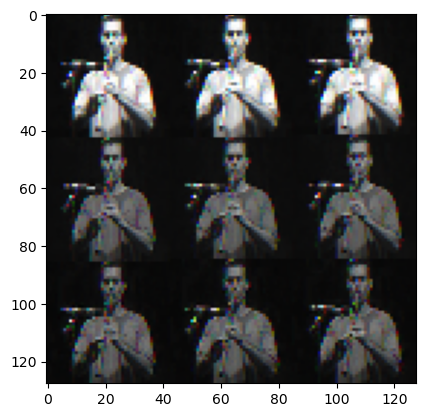

In [21]:
dataiter = iter(train_loader)
images, labels = next(dataiter)
image = images[0]
image.shape 

# torch.Size([3, 28, 28]) # pyplot doesn't like this, so reshape

image = image.reshape(-1,128,3)
plt.imshow(image.numpy())

In [25]:
class UCF_Model(nn.Module):
    def __init__(self, input_size, output_size):
        super(UCF_Model, self).__init__()
        self.input_size = input_size
        self.output_size = output_size
        self.relu = nn.LeakyReLU()
        self.flatten = nn.Flatten()

        self.dropout2 = nn.Dropout(0.2)
        self.dropout3 = nn.Dropout(0.3)
        self.maxpool = nn.MaxPool2d(kernel_size=4)
        
        self.conv1 = nn.Conv2d(in_channels=3 , out_channels=32 , kernel_size=3 , padding=1)
        self.conv2 = nn.Conv2d(in_channels=32 , out_channels=64 , kernel_size=3 , padding=1)
        self.batchnorm1 = nn.BatchNorm2d(64)
        
        self.conv3 = nn.Conv2d(in_channels=64 , out_channels=128 , kernel_size=3 , padding=1)
        self.conv4 = nn.Conv2d(in_channels=128 , out_channels=256 , kernel_size=3 , padding=1)
        self.batchnorm2 = nn.BatchNorm2d(256)
        
        # self.conv5 = nn.Conv2d(in_channels=256 , out_channels=512 , kernel_size=3 , padding=1)
        # self.conv6 = nn.Conv2d(in_channels=512 , out_channels=1028 , kernel_size=3 , padding=1)
        # self.batchnorm3 = nn.BatchNorm2d(1028)
        
        self.l1 = nn.Linear(16384,4096)
        self.l2 = nn.Linear(4096,1024)
        self.batchnorm4 = nn.LayerNorm(1024)
        # self.l3 = nn.Linear(4096,1024)
        # self.l4 = nn.Linear(1024,128)
        # self.batchnorm5 = nn.LayerNorm(128)
        self.l5 = nn.Linear(1024,output_size)
        
    def forward(self, input):
        
        conv1 = self.conv1(input)
        conv2 = self.conv2(conv1)
        batchnorm = self.batchnorm1(conv2)
        relu = self.relu(batchnorm)
        maxpool = self.maxpool(relu)
        
        conv3 = self.conv3(maxpool)
        conv4 = self.conv4(conv3)
        batchnorm = self.batchnorm2(conv4)
        relu = self.relu(batchnorm)
        maxpool = self.maxpool(relu)
        
        # conv5 = self.conv5(maxpool)
        # conv6 = self.conv6(conv5)
        # batchnorm = self.batchnorm2(conv6)
        # relu = self.relu(batchnorm)
        # maxpool = self.maxpool(relu)
        
        flatten = self.flatten(maxpool)
        
        #Neural Network Featuremap input
        dense_l1 = self.l1(flatten)
        dropout = self.dropout3(dense_l1)
        dense_l2 = self.l2(dropout)
        batchnorm = self.batchnorm4(dense_l2)
        dropout = self.dropout2(batchnorm)
        
        relu = self.relu(dropout)
        
        # dense_l3 = self.l3(relu)
        # dropout = self.dropout3(dense_l3)
        
        # relu = self.relu(dropout)
        
        # dense_l4 = self.l4(relu)
        # batchnorm = self.batchnorm5(dense_l4)
        dropout = self.dropout2(batchnorm)
        
        output = self.l5(dropout)
        
        return output

In [26]:
input_size = 3*320*240
output_size = 101
model = UCF_Model(input_size=input_size, output_size=output_size)
model.cuda()

UCF_Model(
  (relu): LeakyReLU(negative_slope=0.01)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (dropout2): Dropout(p=0.2, inplace=False)
  (dropout3): Dropout(p=0.3, inplace=False)
  (maxpool): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (l1): Linear(in_features=16384, out_features=4096, bias=True)
  (l2): Linear(in_features=4096, out_features=1024, bias=True)
  (batchnorm4): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
  (l5): Linear(in_feature

In [27]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adamax(model.parameters(), lr=learning_rate)
for epoch in range(num_epochs):
    for i, (images, labels) in enumerate(train_loader):
        # images, labels = images.type(torch.LongTensor), labels.type(torch.LongTensor)
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        loss = criterion(outputs, labels)
        
        

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (i+1) % 100 == 0:
            print(f'epoch {epoch+1} / {num_epochs}, step {i+1}, loss = {loss.item()}')

    with torch.no_grad():
        n_correct = 0
        n_samples = 0
        for images, labels in test_loader:
            images, labels = images.type(torch.cuda.FloatTensor), labels.type(torch.cuda.FloatTensor)
            labels = labels.to(device)
            outputs = model(images)

            _, predictions = torch.max(outputs, 1)
            n_samples +=labels.shape[0]
            n_correct +=(predictions == labels).sum().item()
        acc = 100.0 * (n_correct / n_samples)
        print(f'epoch {epoch+1} / 10, accuracy = {acc}')

epoch 1 / 20, step 100, loss = 4.965312480926514
epoch 1 / 20, step 200, loss = 4.396888256072998
epoch 1 / 20, step 300, loss = 4.265649795532227
epoch 1 / 20, step 400, loss = 3.9055514335632324
epoch 1 / 20, step 500, loss = 3.696011781692505
epoch 1 / 20, step 600, loss = 3.519813060760498
epoch 1 / 20, step 700, loss = 2.8430349826812744
epoch 1 / 20, step 800, loss = 3.375704288482666
epoch 1 / 20, step 900, loss = 2.514742612838745
epoch 1 / 20, step 1000, loss = 1.9505412578582764
epoch 1 / 20, step 1100, loss = 2.4955592155456543
epoch 1 / 20, step 1200, loss = 2.3163561820983887
epoch 1 / 20, step 1300, loss = 2.0566630363464355
epoch 1 / 20, step 1400, loss = 1.6143944263458252
epoch 1 / 20, step 1500, loss = 1.9610086679458618
epoch 1 / 20, step 1600, loss = 1.6880089044570923
epoch 1 / 20, step 1700, loss = 1.768929123878479
epoch 1 / 20, step 1800, loss = 2.3544421195983887
epoch 1 / 20, step 1900, loss = 1.6324790716171265
epoch 1 / 20, step 2000, loss = 1.72184550762176